In [1]:
import argparse
import os

os.chdir("..")

import math
import yaml
import logging
import random
import numpy as np
import sys
import imageio
from train.trainUtils import *
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn.functional as F

In [2]:
def parse_args(arg_list=None):
    parser = argparse.ArgumentParser(
        description="Unconditioned Video Diffusion Inference"
    )
    parser.add_argument(
        "--dataset-path", type=str, required=True,
        help="Directory containing input reference videos."
    )
    parser.add_argument(
        "--pretrained-model-name-or-path", type=str, required=True,
        help="Path or HF ID where transformer/vae/scheduler are stored."
    )
    parser.add_argument(
        "--checkpoint-path", type=str, required=True,
        help="Path to fine‐tuned checkpoint containing transformer state_dict."
    )
    parser.add_argument(
        "--output-dir", type=str, required=True,
        help="Where to write generated videos."
    )
    parser.add_argument(
        "--model-config", type=str, required=True,
        help="YAML file describing model params (height, width, num_reference, num_target, etc.)"
    )
    parser.add_argument(
        "--batch-size", type=int, default=1,
        help="Batch size per device (usually 1 for inference)."
    )
    parser.add_argument(
        "--num-inference-steps", type=int, default=50,
        help="Number of reverse diffusion steps to run."
    )
    parser.add_argument(
        "--mixed-precision", type=str, default="bf16",
        help="Whether to run backbone in 'fp16', 'bf16', or 'fp32'."
    )
    parser.add_argument(
        "--seed", type=int, default=42,
        help="Random seed for reproducibility."
    )
    parser.add_argument(
        "--shuffle", type=int, default=False,
        help="Whether to shuffle dataset. Usually False for inference."
    )
    parser.add_argument(
        "--is-uncond", type=bool, default=False,
        help=""
    )
    parser.add_argument(
        "--learning-rate", type=float, default=1e-4
    )

    # If arg_list is None, argparse picks up sys.argv; 
    # otherwise it treats arg_list as the full argv list.
    return parser.parse_args(arg_list)

args = [
    "--dataset-path", "/scratch/ondemand28/harryscz/head_audio/data/data256/uv",
    "--pretrained-model-name-or-path", "/scratch/ondemand28/harryscz/model/CogVideoX-2b",
    "--checkpoint-path",  "/scratch/ondemand28/harryscz/head_audio/trainOutput/checkpoint-1000.pt",
    "--output-dir",  "/scratch/ondemand28/harryscz/diffusion/videoOut",
    "--model-config",  "/scratch/ondemand28/harryscz/diffusion/train/model_config.yaml",
    "--batch-size",  "1",
    "--num-inference-steps",  "50",
    "--mixed-precision",  "no",
    "--seed",  "42",
    "--shuffle",  "0",
    "--learning-rate", "0.0001"
]

args = parse_args(args)

with open(args.model_config, "r") as f: model_config = yaml.safe_load(f)


In [3]:
from accelerate import Accelerator
from accelerate.utils import DistributedDataParallelKwargs, ProjectConfiguration, set_seed
from accelerate.logging import get_logger

with open(args.model_config, "r") as f: model_config = yaml.safe_load(f)
if args.mixed_precision.lower() == "fp16":
    dtype = torch.float16
elif args.mixed_precision.lower() == "bf16":
    dtype = torch.bfloat16
else:
    dtype = torch.float32

accelerator_project_config = ProjectConfiguration(project_dir=args.output_dir,
                                                    logging_dir=os.path.join(args.output_dir, "logs"))
ddp_kwargs = DistributedDataParallelKwargs(find_unused_parameters=False)
accelerator = Accelerator(mixed_precision=args.mixed_precision,
                            project_config=accelerator_project_config,
                            kwargs_handlers=[ddp_kwargs])

# 2.4 Set random seed
if args.seed is not None:
    set_seed(args.seed + accelerator.process_index)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

logger = get_logger(__name__)
logging.basicConfig(
    format="%(asctime)s - %(levelname)s - %(name)s - %(message)s",
    datefmt="%m/%d/%Y %H:%M:%S",
    level=logging.INFO,
)
logger.info("Accelerator state:", accelerator.state)

--- Logging error ---
Traceback (most recent call last):
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/logging/__init__.py", line 1083, in emit
    msg = self.format(record)
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/logging/__init__.py", line 927, in format
    return fmt.format(record)
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/logging/__init__.py", line 663, in format
    record.message = record.getMessage()
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/logging/__init__.py", line 367, in getMessage
    msg = msg % self.args
TypeError: not all arguments converted during string formatting
Call stack:
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/runpy.py", line 87, in

In [4]:
#### Dataset #####
# Video data have shape [B, C, F, H, W]

from data.VideoDataset import VideoDataset 
from torch.utils.data import DataLoader, DistributedSampler

dataset = VideoDataset(
    videos_dir=args.dataset_path,
)
if args.shuffle:
    sampler = DistributedSampler(
        dataset,
        num_replicas=accelerator.num_processes,
        rank=accelerator.process_index,
        shuffle=True
    )
else:
    sampler = None
data_loader = DataLoader(
    dataset,
    batch_size=args.batch_size,
    # sampler=sampler,
    collate_fn=lambda x: x[0],   # since dataset returns already‐batched items
    num_workers=2,
    pin_memory=True,
)
logger.info(f"Number of test examples: {len(data_loader)}")

06/27/2025 00:51:07 - INFO - __main__ - Number of test examples: 13626


In [5]:
#### Load Model ####
device = "cuda"
weight_dtype = torch.float32

%load_ext autoreload
%autoreload 2

from diffusers import AutoencoderKLCogVideoX, CogVideoXDDIMScheduler
from model.cap_transformer import CAPVideoXTransformer3DModel
from diffusers.optimization import get_scheduler
from inference.inference_pipeline import *

transformer = CAPVideoXTransformer3DModel.from_pretrained(
    args.pretrained_model_name_or_path,
    low_cpu_mem_usage=False,
    device_map=None,
    ignore_mismatched_sizes=True,
    subfolder="transformer",
    torch_dtype=torch.float32,
    cond_in_channels=1,  # only one channel (the ref_mask)
    sample_width=model_config["width"] // 8,
    sample_height=model_config["height"] // 8,
    sample_frames=29,
    max_text_seq_length=1,
    max_n_references=model_config["max_n_references"],
    apply_attention_scaling=model_config["use_growth_scaling"],
    use_rotary_positional_embeddings=False,
)

vae = AutoencoderKLCogVideoX.from_pretrained(
    args.pretrained_model_name_or_path, subfolder="vae"
)
scheduler = CogVideoXDDIMScheduler.from_pretrained(
    args.pretrained_model_name_or_path,
    subfolder="scheduler",
)

# if args.enable_slicing: vae.enable_slicing()
# if args.enable_tiling:  vae.enable_tiling()

vae.eval().to(dtype)
transformer.eval().to(dtype)

vae, transformer, scheduler, data_loader = accelerator.prepare(vae, transformer, scheduler, data_loader)

Some weights of the model checkpoint at /scratch/ondemand28/harryscz/model/CogVideoX-2b were not used when initializing CAPVideoXTransformer3DModel: 
 ['patch_embed.text_proj.weight, patch_embed.text_proj.bias']
Some weights of CAPVideoXTransformer3DModel were not initialized from the model checkpoint at /scratch/ondemand28/harryscz/model/CogVideoX-2b and are newly initialized: ['patch_embed.cond_proj.weight', 'patch_embed.ref_temp_proj.bias', 'patch_embed.cond_proj.bias', 'patch_embed.audio_proj.weight', 'patch_embed.ref_temp_proj.weight', 'patch_embed.audio_proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [6]:
ckpt_path = "/scratch/ondemand28/harryscz/head_audio/trainOutput/checkpoint-4000.pt"
ckpt = torch.load(ckpt_path, map_location="cpu")
transformer.load_state_dict(ckpt["state_dict"], strict=False)

/tmp/ipykernel_84696/1614443576.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(ckpt_path, map_location="cpu")


[2025-06-27 00:51:18,014] [INFO] [real_accelerator.py:254:get_accelerator] Setting ds_accelerator to cuda (auto detect)


06/27/2025 00:51:19 - INFO - root - gcc -pthread -B /scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/compiler_compat -Wno-unused-result -Wsign-compare -DNDEBUG -O2 -Wall -fPIC -O2 -isystem /scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/include -I/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/include -fPIC -O2 -isystem /scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/include -fPIC -c /tmp/tmprjicp6g5/test.c -o /tmp/tmprjicp6g5/test.o
06/27/2025 00:51:19 - INFO - root - gcc -pthread -B /scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/compiler_compat /tmp/tmprjicp6g5/test.o -laio -o /tmp/tmprjicp6g5/a.out
/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/compiler_compat/ld: cannot find -laio: No such file or directory
collect2: error: ld returned 1 exit status
06/27/2025 00:51:20 - INFO - root - gcc -pthread -B /scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/compiler_compat -Wno-unused-result -Wsign-compare -DNDEBUG -O2 -Wall -fPIC -O2 -isystem /scra

<All keys matched successfully>

In [7]:
trainable_parameters =  list(filter(lambda p: p.requires_grad, transformer.parameters()))
params_to_optimize = [{"params": trainable_parameters, "lr": args.learning_rate}]

optimizer = get_optimizer(
    learning_rate=args.learning_rate,
    adam_beta1=0.9, 
    adam_beta2=0.95, 
    adam_epsilon=1e-8, 
    adam_weight_decay=1e-4, 
    params_to_optimize=params_to_optimize, 
    # use_deepspeed=use_deepspeed_optimizer
)

def encode_video(vae, video):
    with torch.no_grad():
        dist = vae.encode(video).latent_dist.sample()
    latent = dist * vae.config.scaling_factor
    return latent.permute(0,2,1,3,4).contiguous()

def unwrap_model(m):
    m = accelerator.unwrap_model(m)
    return m._orig_mod if hasattr(m, "_orig_mod") else m

def decode_video(vae, latents):
    with torch.no_grad():
        latents = latents.permute(0, 2, 1, 3, 4)  # [batch_size, num_channels, num_frames, height, width]
        latents = 1 / vae.config.scaling_factor * latents

        frames = vae.decode(latents).sample
        return frames
        

In [8]:
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm

def plot(tensor):
    video_tensor = tensor  # shape: [1, 13, 16, 32, 32]

    # Select a specific frame, e.g., frame 5
    t = 5
    frame = video_tensor[0, t]  # shape: [16, 32, 32]

    # Plot each of the 16 channels
    fig, axes = plt.subplots(4, 4, figsize=(8, 8))
    axes = axes.flatten()

    for i in range(16):
        channel = frame[i].cpu().numpy()
        axes[i].imshow(channel, cmap='gray')
        axes[i].axis('off')
        axes[i].set_title(f"Channel {i}")

    plt.tight_layout()
    plt.show()

def plot_video(tensor):
    video_tensor = tensor  # Replace this with your actual tensor

    # Remove batch dimension: [3, 50, 256, 256]
    video_tensor = video_tensor.squeeze(0)

    # Convert to [T, C, H, W]
    video_tensor = video_tensor.permute(1, 0, 2, 3)  # [50, 3, 256, 256]

    # Convert to numpy for plotting
    frames = video_tensor.cpu().numpy()

    # Normalize (if in range [0, 1], skip this)
    frames = (frames * 255).clip(0, 255).astype("uint8")

    # Plot a few frames
    num_to_plot = 6
    fig, axes = plt.subplots(1, num_to_plot, figsize=(15, 3))

    for i in range(num_to_plot):
        axes[i].imshow(frames[i].transpose(1, 2, 0))  # [H, W, C]
        axes[i].axis("off")
        axes[i].set_title(f"Frame {i}")

    plt.tight_layout()
    plt.show()


/tmp/ipykernel_84696/338012713.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for step in tqdm(range(1, 2)):


  0%|          | 0/1 [00:00<?, ?it/s]

/tmp/ipykernel_84696/338012713.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for idx, batch in enumerate(tqdm(data_loader)):


  0%|          | 0/13626 [00:00<?, ?it/s]

20 - loss: 0.11337987333536148
40 - loss: 0.8498144745826721
60 - loss: 0.5756747126579285
80 - loss: 0.7831442356109619
100 - loss: 0.11612594127655029
120 - loss: 0.35915011167526245
140 - loss: 0.11646293848752975
160 - loss: 0.6410056352615356
180 - loss: 0.1329813003540039
200 - loss: 0.11419077217578888
Model Input t=tensor([863], device='cuda:0'), step=200


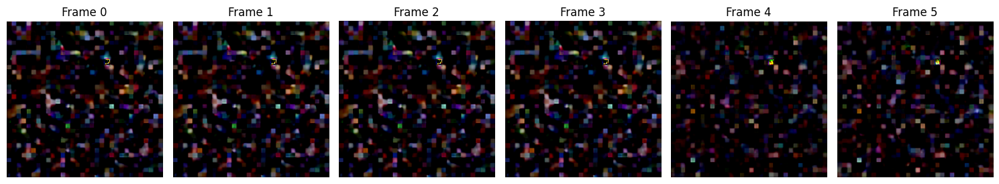

Model Pred t=tensor([863], device='cuda:0'), step=200


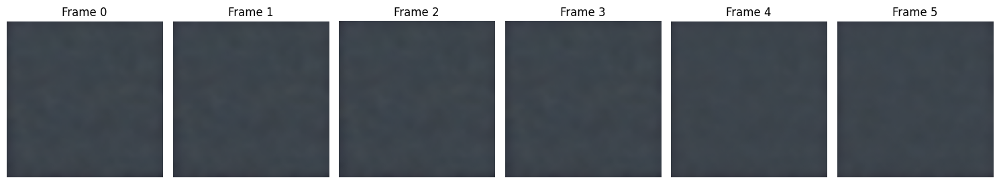

0.11419077217578888
Model Input t=tensor([696], device='cuda:0'), step=205


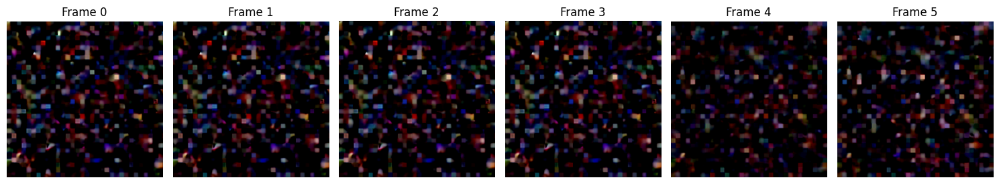

Model Pred t=tensor([696], device='cuda:0'), step=205


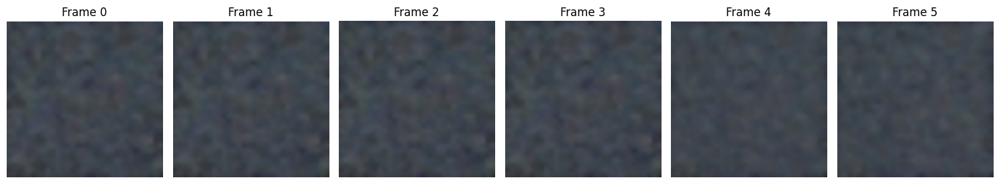

0.13130706548690796
Model Input t=tensor([21], device='cuda:0'), step=210


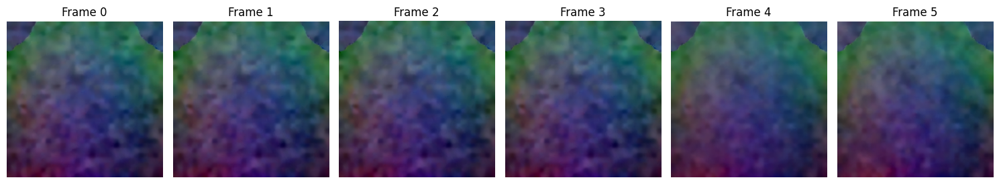

Model Pred t=tensor([21], device='cuda:0'), step=210


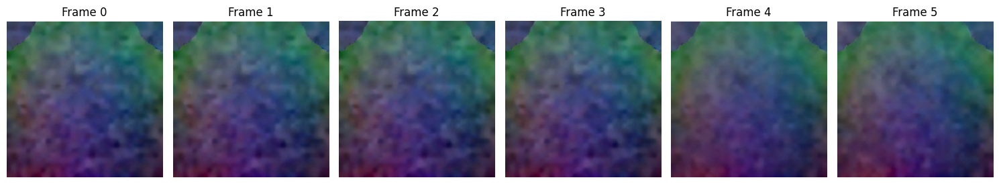

0.9547921419143677
Model Input t=tensor([380], device='cuda:0'), step=215


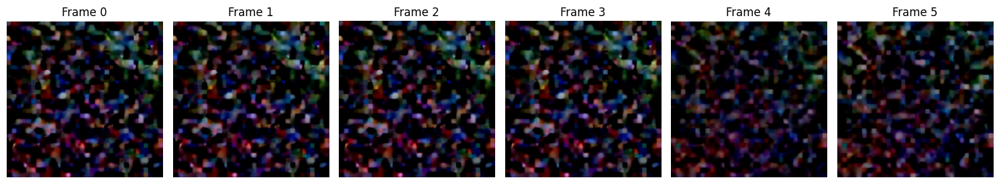

Model Pred t=tensor([380], device='cuda:0'), step=215


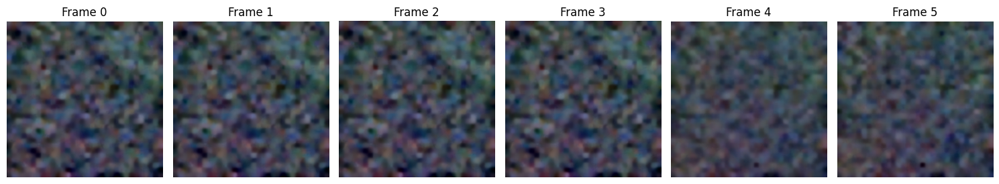

0.2900139093399048
220 - loss: 0.7556176781654358
Model Input t=tensor([102], device='cuda:0'), step=220


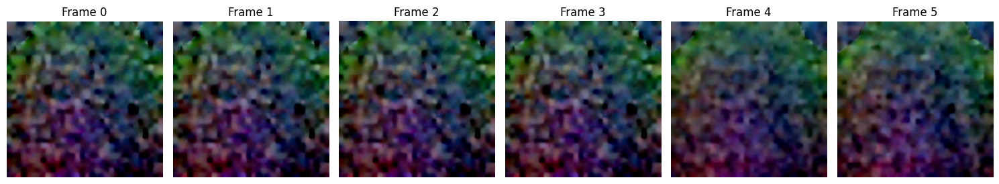

Model Pred t=tensor([102], device='cuda:0'), step=220


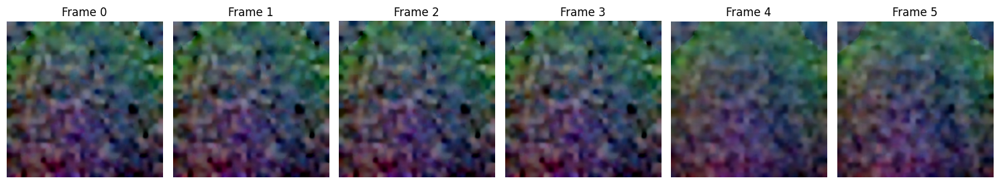

0.7556176781654358
Model Input t=tensor([454], device='cuda:0'), step=225


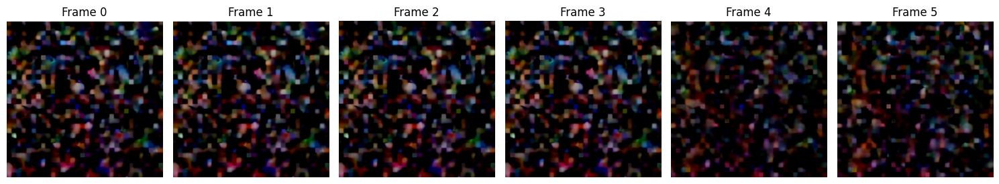

Model Pred t=tensor([454], device='cuda:0'), step=225


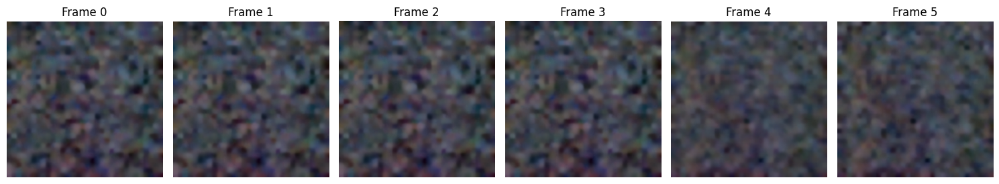

0.2291535884141922
Model Input t=tensor([76], device='cuda:0'), step=230


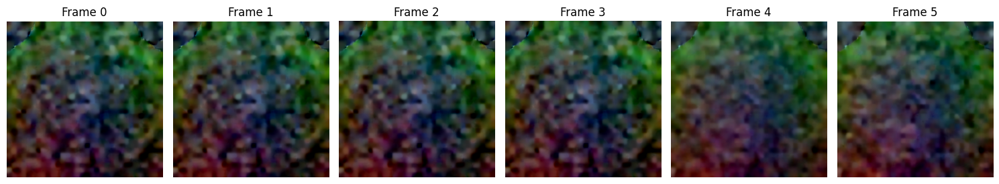

Model Pred t=tensor([76], device='cuda:0'), step=230


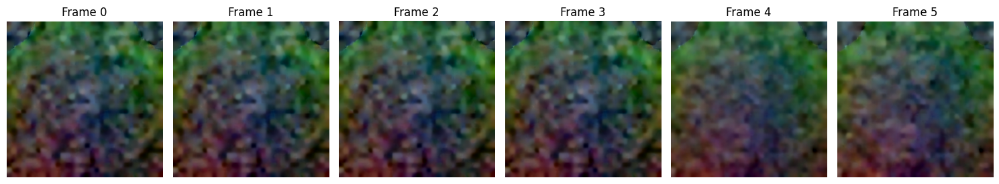

0.8124314546585083
Model Input t=tensor([174], device='cuda:0'), step=235


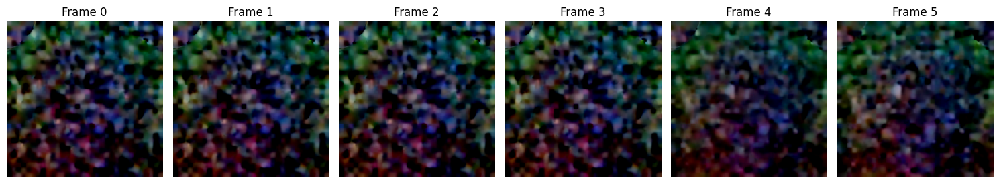

Model Pred t=tensor([174], device='cuda:0'), step=235


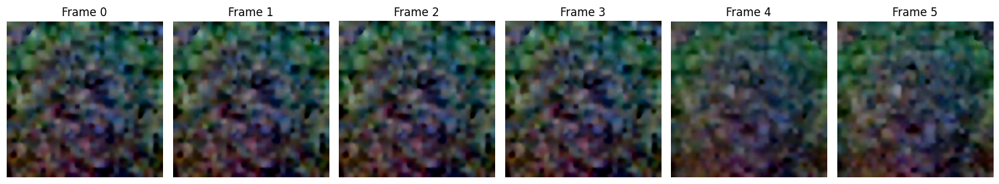

0.6011883020401001
240 - loss: 0.1791556477546692
Model Input t=tensor([536], device='cuda:0'), step=240


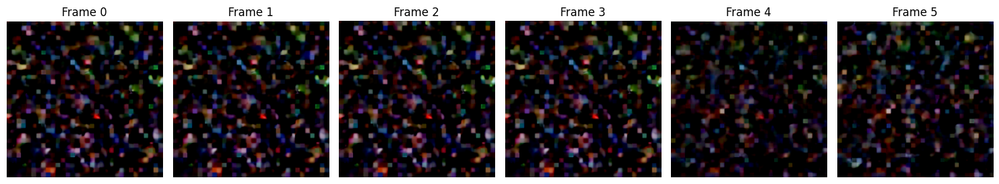

Model Pred t=tensor([536], device='cuda:0'), step=240


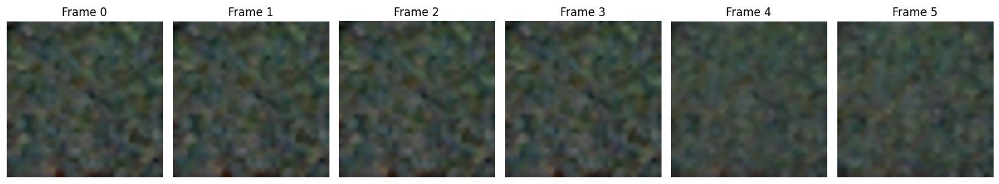

0.1791556477546692
Model Input t=tensor([565], device='cuda:0'), step=245


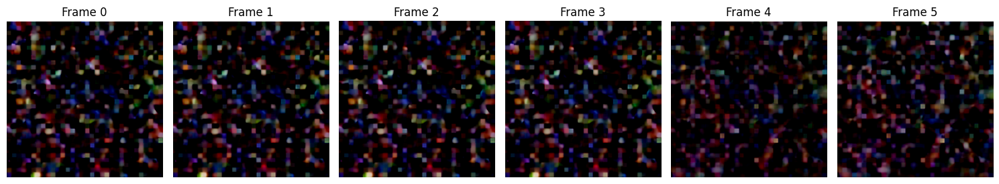

Model Pred t=tensor([565], device='cuda:0'), step=245


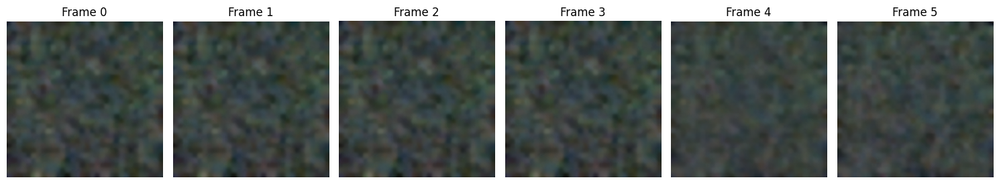

0.16923195123672485
Model Input t=tensor([818], device='cuda:0'), step=250


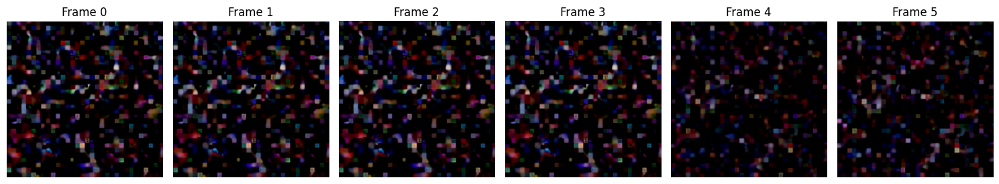

Model Pred t=tensor([818], device='cuda:0'), step=250


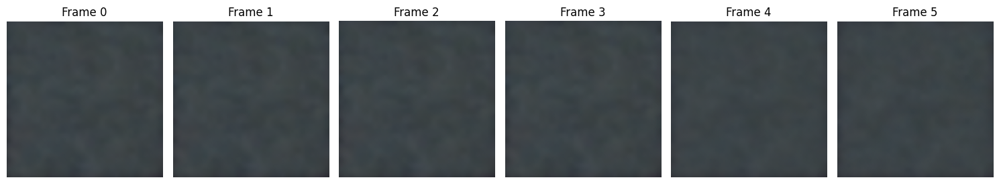

0.11894576251506805
Model Input t=tensor([774], device='cuda:0'), step=255


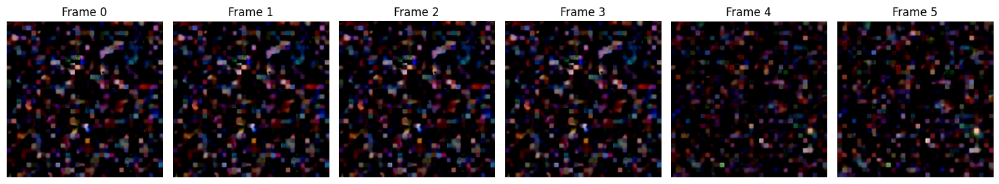

Model Pred t=tensor([774], device='cuda:0'), step=255


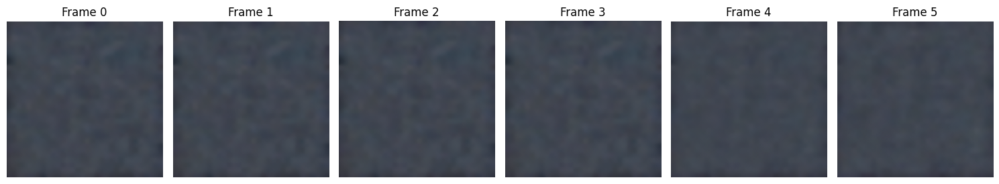

0.12397684156894684
260 - loss: 0.11289899796247482
Model Input t=tensor([872], device='cuda:0'), step=260


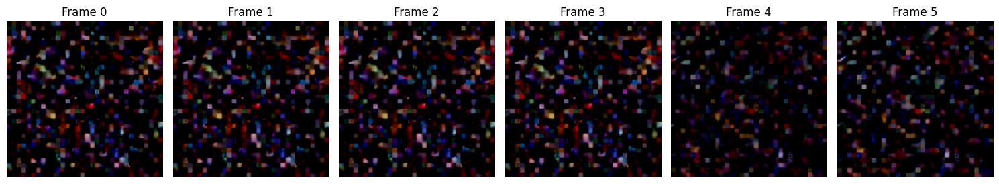

Model Pred t=tensor([872], device='cuda:0'), step=260


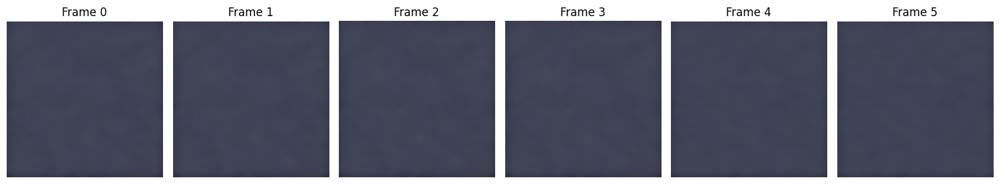

0.11289899796247482
Model Input t=tensor([617], device='cuda:0'), step=265


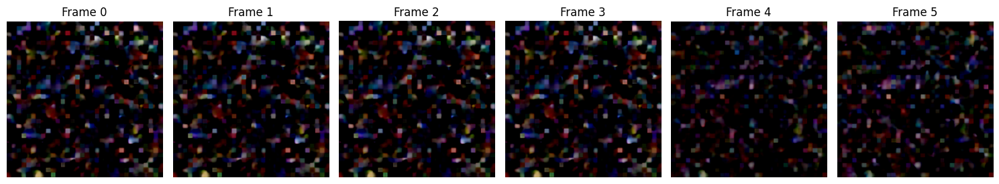

Model Pred t=tensor([617], device='cuda:0'), step=265


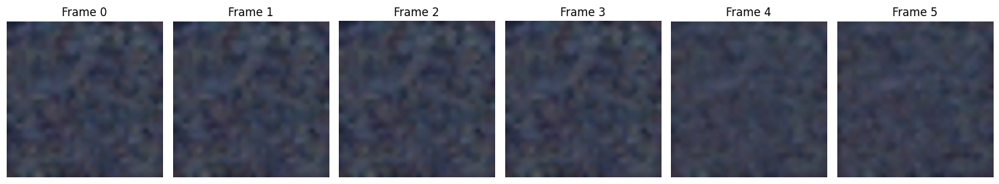

0.1547313928604126
Model Input t=tensor([728], device='cuda:0'), step=270


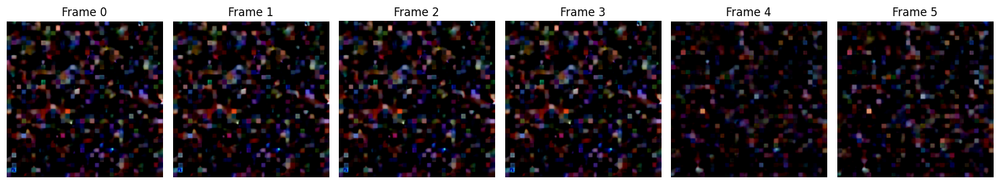

Model Pred t=tensor([728], device='cuda:0'), step=270


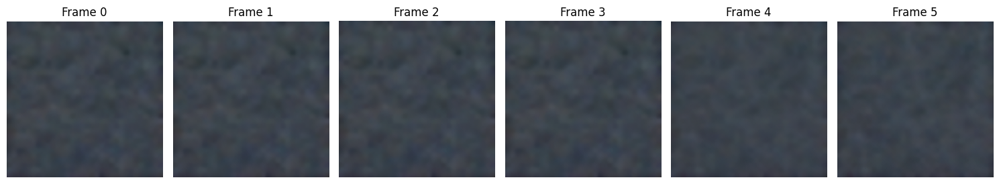

0.1282322108745575
Model Input t=tensor([179], device='cuda:0'), step=275


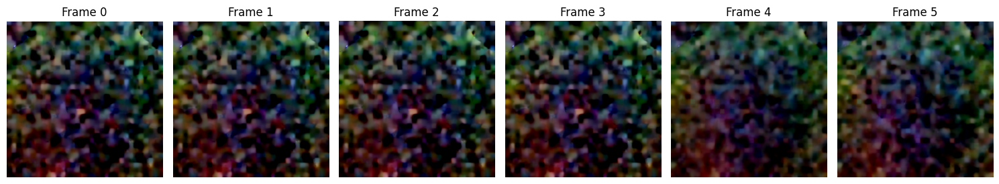

Model Pred t=tensor([179], device='cuda:0'), step=275


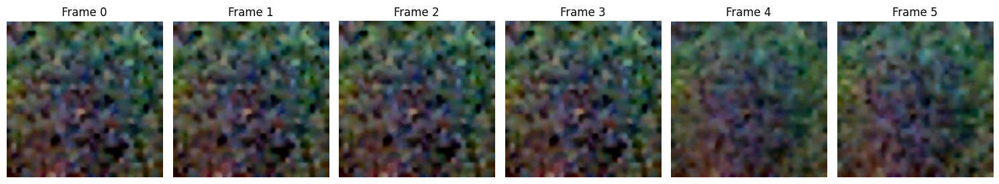

0.5821686387062073
280 - loss: 0.11259779334068298
Model Input t=tensor([935], device='cuda:0'), step=280


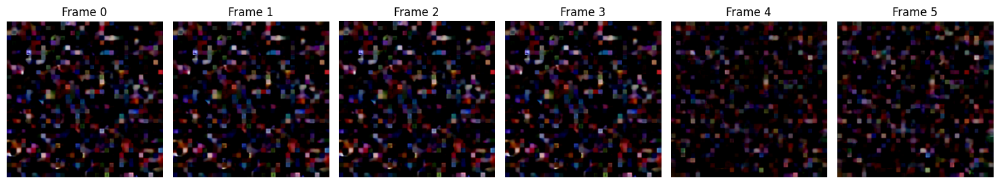

Model Pred t=tensor([935], device='cuda:0'), step=280


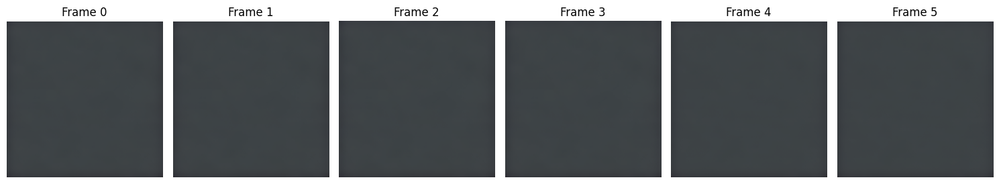

0.11259779334068298


KeyboardInterrupt: 

In [16]:
# weight_dtype=torch.float32
transformer = transformer.train().to("cuda")

for step in tqdm(range(1, 2)):
    # for step in range(5):
    ct = 1
    for idx, batch in enumerate(tqdm(data_loader)):
        # models_to_accumulate =  [transformer] !!!!!!!!!!!!!!
        # with accelerator.accumulate(models_to_accumulate): !!!!!!!!!!!!!!!
            latent_chunks = []
            ref_mask_chunks = []

            # Initialize necessary data for diffusion
            for i, video in enumerate(batch["video_chunks"]):
                video = video[:,:,:50,...].to(accelerator.device).to(weight_dtype)
                if video.shape[2] > 29: video = video[:,:,:29,...] 

                latent = encode_video(vae, video) # [B, F, C_z, H, W]
                # plot(latent)
                
                # Encode Video
                latent = encode_video(vae, video) # [B, F, C_z, H, W]
                latent_chunks.append(latent)

                # Ref Mask Chunk, Mask of shape [B, F, H, W, C]
                B, F_z, C, H, W = latent.shape
                rm = torch.zeros((B, F_z, 1, H, W), device=accelerator.device, dtype=weight_dtype)
                rm[:, 0] = 1.0
                ref_mask_chunks.append(rm)

            sequence_infos = [[False, torch.arange(chunk.shape[1])]for chunk in latent_chunks]
            
            # Sample Random Noise
            B, F_z, C_z, H_z, W_z = latent_chunks[0].shape
            timesteps = torch.randint(
                0,
                999,
                # scheduler.config.num_train_timesteps,
                (B,),
                device=accelerator.device
            ).long()

            noised_latents = []
            for idx, latent in enumerate(latent_chunks):
                noise = torch.randn_like(latent, device=accelerator.device, dtype=weight_dtype)
                noisy_latent = scheduler.add_noise(latent, noise, timesteps)
                # print(f"Noised Latent t={timesteps}, step={step}")
                # brown = decode_video(vae, noisy_latent)
                # plot_video(brown)
                noised_latents.append(noisy_latent)

            # Trivial Audio, Text, and Condition
            audio_embeds = torch.zeros((B, F_z, 768), dtype=weight_dtype, device=accelerator.device)
            text_embeds  = torch.zeros((B, 1,
                unwrap_model(transformer).config.attention_head_dim * unwrap_model(transformer).config.num_attention_heads
            ), dtype=weight_dtype, device=accelerator.device)
            B, F_z, C_z, H_z, W_z = noised_latents[0].shape
            zero_cond = [torch.zeros((B, F_z, 1, H_z, W_z), dtype=weight_dtype, device=accelerator.device)] * len(noised_latents)

            # Predict Noise
            # print(noised_latents[0].shape)

            model_outputs = transformer(
                hidden_states=noised_latents,
                encoder_hidden_states=text_embeds,
                audio_embeds=audio_embeds,
                condition=zero_cond,
                timestep=timesteps,
                sequence_infos=sequence_infos,
                image_rotary_emb=None,
                return_dict=False
            )[0]

            model_output = torch.cat(model_outputs, dim=0)
            model_input = torch.cat(latent_chunks, dim=0)
            noisy_input = torch.cat(noised_latents, dim=0)

            # print("model_output", model_output.min(), model_output.max())
            model_pred = scheduler.get_velocity(model_output, noisy_input, timesteps)

            alphas_cumprod = scheduler.alphas_cumprod[timesteps].to(weight_dtype)
            weights = 1 / (1 - alphas_cumprod)
            while len(weights.shape) < len(model_pred.shape):
                weights = weights.unsqueeze(-1)
            target = model_input
            loss = torch.mean((weights * (model_pred - target) ** 2).reshape(B, -1), dim=1)
            loss = loss.mean()
            accelerator.backward(loss)
            optimizer.step() 
            optimizer.zero_grad(set_to_none=True)
            if ct % 20 == 0: print(f"{ct} - loss: {loss.item()}")

            if (ct % 5 == 0) and ct >= 200: 
                recon = decode_video(vae, noisy_input)
                print(f"Model Input t={timesteps}, step={ct}")
                plot_video(recon)
                print(f"Model Pred t={timesteps}, step={ct}")
                drift = decode_video(vae, model_pred)
                plot_video(drift)
                print(loss.item())
            ct += 1

            

In [ ]:
# %load_ext autoreload
# %autoreload 2

from inference.inference_pipeline import *

pipe = VideoDiffusionPipeline(
    vae=vae,
    transformer=transformer,
    scheduler=scheduler
)
batch = next(iter(data_loader))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


AttributeError: 'Namespace' object has no attribute 'sample_frames'

tensor([999, 979, 959, 939, 919, 899, 879, 859, 839, 819, 799, 779, 759, 739,
        719, 699, 679, 659, 639, 619, 599, 579, 559, 539, 519, 499, 479, 459,
        439, 419, 399, 379, 359, 339, 319, 299, 279, 259, 239, 219, 199, 179,
        159, 139, 119,  99,  79,  59,  39,  19], device='cuda:0')


Inference Progress:   8%|▊         | 4/50 [00:02<00:23,  1.97it/s]

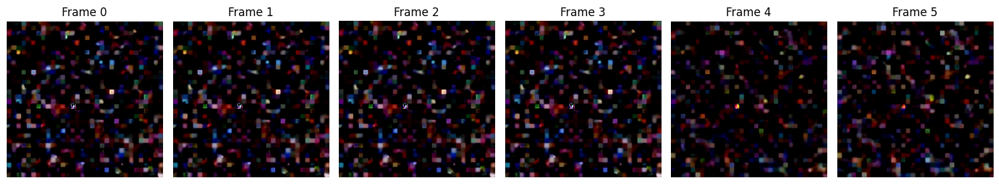

Inference Progress:  18%|█▊        | 9/50 [00:06<00:26,  1.56it/s]

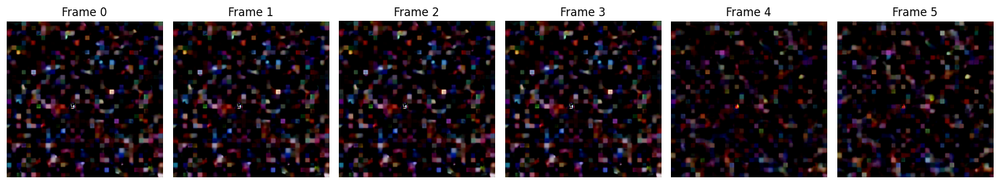

Inference Progress:  28%|██▊       | 14/50 [00:10<00:23,  1.53it/s]

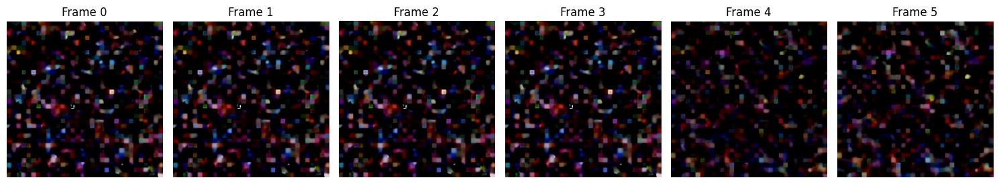

Inference Progress:  38%|███▊      | 19/50 [00:14<00:20,  1.53it/s]

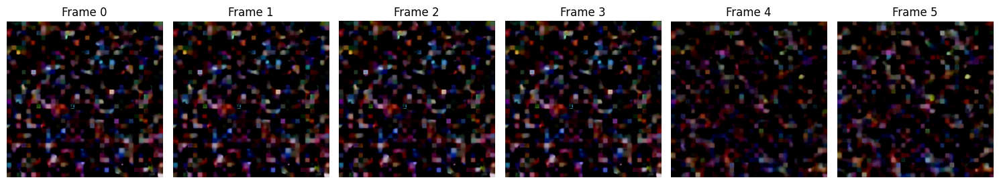

Inference Progress:  48%|████▊     | 24/50 [00:19<00:17,  1.52it/s]

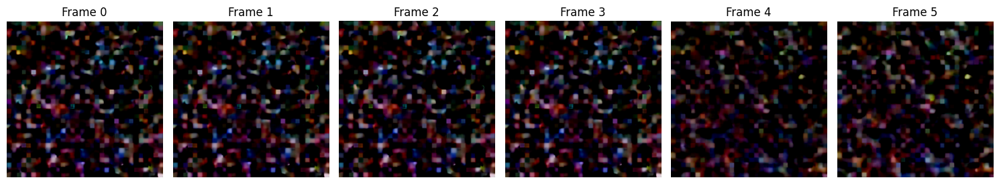

Inference Progress:  58%|█████▊    | 29/50 [00:23<00:13,  1.52it/s]

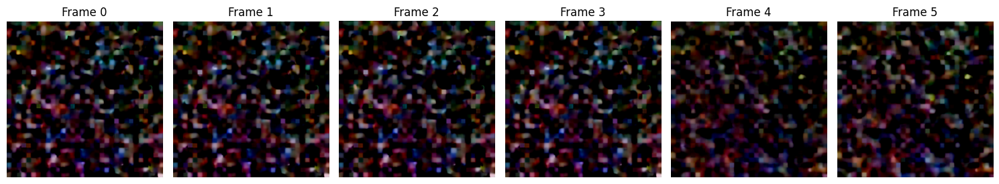

Inference Progress:  68%|██████▊   | 34/50 [00:27<00:10,  1.52it/s]Traceback (most recent call last):
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor
Traceback (most recent call last):
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/multiprocessing/queues.py", line 239, in _feed
    reader_close()
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/scratch/ondemand28/harryscz/anaconda3/envs/pytorch3d/lib/python3.9/multiprocessing/conne

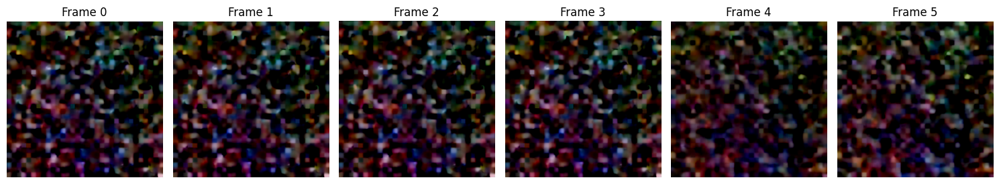

Inference Progress:  78%|███████▊  | 39/50 [00:32<00:07,  1.46it/s]

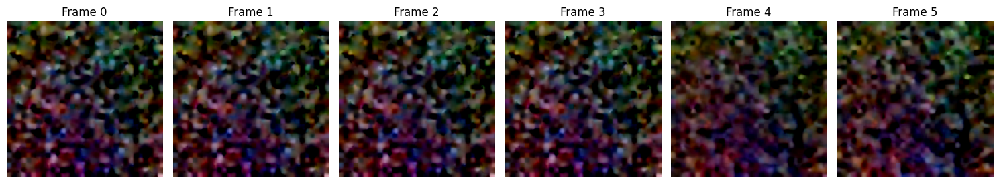

Inference Progress:  88%|████████▊ | 44/50 [00:36<00:03,  1.50it/s]

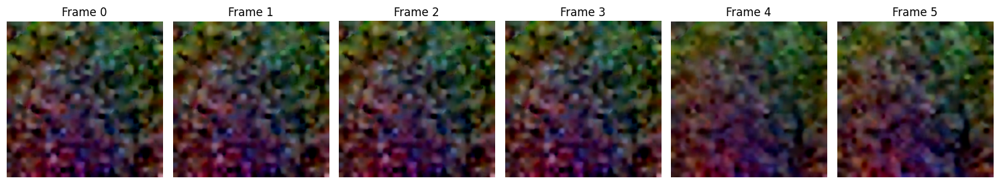

Inference Progress:  98%|█████████▊| 49/50 [00:40<00:00,  1.51it/s]

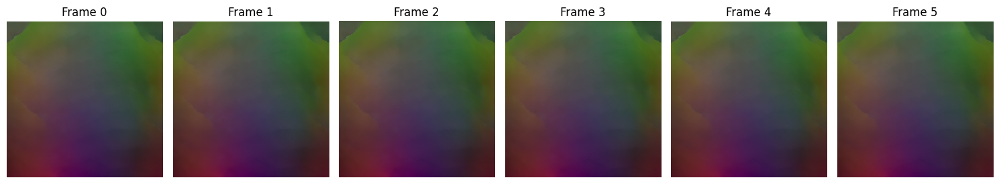

Inference Progress: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]


In [17]:
videos = pipe(batch, num_inference_steps=50, return_decode_latent=True, return_latent=False, sample_frames=29)